In [1]:
import numpy as np
from numpy.fft import fft, ifft
from scipy.io import wavfile
import matplotlib.pyplot as plt
from IPython.display import Audio
from scipy import signal
import import_ipynb
import Helpers
import matplotlib

figsize=(10,5)
matplotlib.rcParams.update({'font.size': 16})

fs=44100

importing Jupyter notebook from Helpers.ipynb


In this notebook, we will implement and test an easy channel vocoder. As an example signal to test the vocoder with, we are going to use dry samples from the song "Nightcall" by french artist Kavinsky.

![Nightcall](https://upload.wikimedia.org/wikipedia/en/5/5b/Kavinsky_Nightcall_2010.png)

First, let's listen to the original song: https://youtu.be/46qo_V1zcOM?t=30

We are now going to recreate the lead vocoder using 2 signal: we need a modulator signal, the voice, pronouning the lyrics, and a carrier signal, a synthesizer, containing the notes for the pitch.

## The modulator and the carrier signals

Let's first import the modulator signal. It is simply the lyrics spoken at the right rhythm. No need to sing or pay attention to the pitch, only the prononciation and the rhythm of the text is going to matter. Note the voice sample is available for free on Splice, an online resource for audio production.

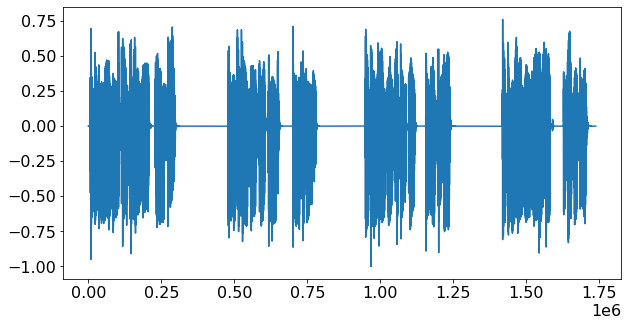

In [3]:
fs, data = wavfile.read('samples/nightcall_modulator.wav')
nightcall_modulator = np.array(data, dtype=np.float32)
nightcall_modulator /= np.max(np.abs(nightcall_modulator) )
plt.figure(figsize=figsize)
plt.plot(nightcall_modulator)
Audio("samples/nightcall_modulator.wav", autoplay=False)

Second, we import a carrier signal, which is simply a synthesizer playing the chords that are gonna be used for the vocoder. Note that the carrier signal does not need to feature silent parts, since the modulator's silences will automatically mute the final vocoded track. The carrier and the modulator simply need to be in synch with each other.

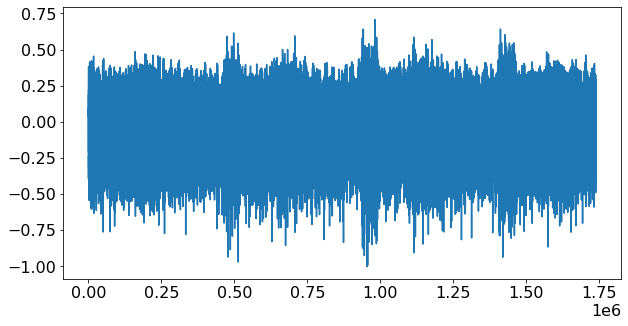

In [4]:
fs, data = wavfile.read('samples/nightcall_carrier.wav')
nightcall_carrier = np.array(data, dtype=np.float32)
nightcall_carrier /= np.max(np.abs(nightcall_carrier) )
plt.figure(figsize=figsize)
plt.plot(nightcall_carrier)

Audio("samples/nightcall_carrier.wav", autoplay=False)

## The channel vocoder

We can now implement the channel vocoder itself! It takes as input both signals presented above, as well as an integer controlling the number of channels (bands) of the vocoder. A larger number of channels results in the finer grained vocoded sound, but also takes more time to compute. Some artists may voluntarily use a lower numer of bands to increase the artificial effect of the vocoder. Note also that uniform noise is added to each carrier band. This is a popular trick as it creates a more crispy, intelligible sound. Try playing with it!

In [5]:
def channel_vocoder(modulator, carrier, n_bands=32):
    
    band_freqs = np.logspace(2, 14, n_bands+1, base=2) # get all the limits between the bands, in log space
    
    modul_bands = np.zeros((n_bands, modulator.size)) # Placeholder for all bands
    carrier_bands = np.zeros((n_bands, carrier.size)) # Placeholder for all bands
    result_bands = np.zeros((n_bands, carrier.size)) # Placeholder for result

    for i in range(n_bands):
        # Channels for the carrier
        carrier_bands[i] = butter_pass_filter(carrier + np.random.random(carrier.size), np.array((band_freqs[i], band_freqs[i+1])), fs, btype="band", order=5).astype(np.float32) # Carrier + uniform noise 

        # Channels for the modulator
        modul_bands[i] = butter_pass_filter(modulator, np.array((band_freqs[i], band_freqs[i+1])), fs, btype="band", order=5).astype(np.float32) 
        # Envelope computation of the modulator
        modul_bands[i] = np.where(modul_bands[i]<0,0,modul_bands[i]) # Rectifier
        modul_bands[i] = moving_average(modul_bands[i], 500)

        # Multiply carrier and modulator
        result_bands[i] = modul_bands[i] * carrier_bands[i]

    result = np.sum(result_bands, 0)
    return result / np.max(np.abs(result) ) # Normalize

In [6]:
nightcall_vocoder = channel_vocoder(nightcall_modulator, nightcall_carrier, n_bands=32)

wavfile.write('samples/nightcall_vocoder.wav', fs, (0x7FFF * nightcall_vocoder).astype(np.int16))
Audio("samples/nightcall_vocoder.wav", autoplay=False)

The vocoded voice is still perfectly intelligible, and it's easy to understand the lyrics. However, the pitch of the voice is now the synthesizer playing chords! We finally plot the STFT of all 3 signals. One can notice that the vocoded signal has kept the general shape of the voice (modulator) signal, but is using the frequency information from the carrier!

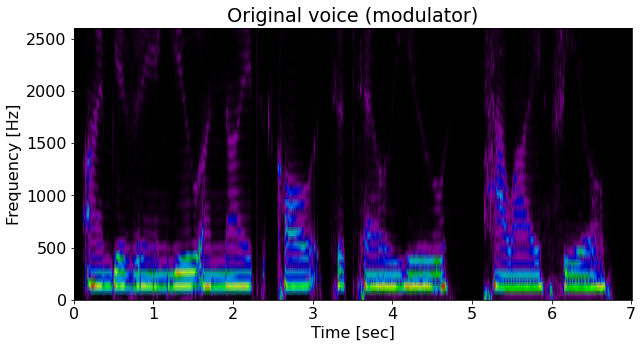

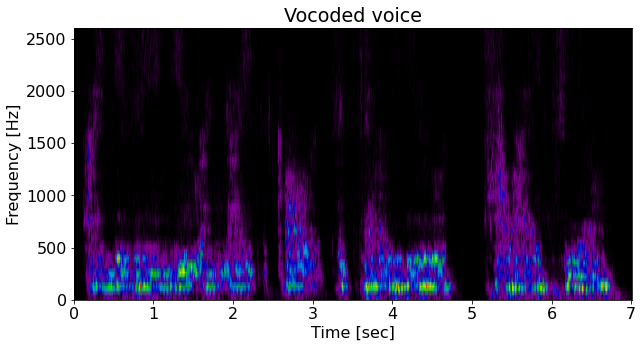

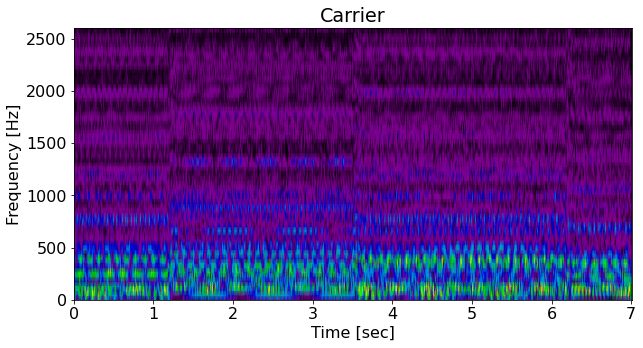

In [7]:
# Plot
f, t, Zxx = signal.stft(nightcall_modulator[:7*fs], fs, nperseg=1000)
plt.figure(figsize=figsize)
plt.pcolormesh(t, f[:60], np.abs(Zxx[:60,:]), cmap='nipy_spectral', shading='gouraud')
plt.title("Original voice (modulator)")
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()

f, t, Zxx = signal.stft(nightcall_vocoder[:7*fs], fs, nperseg=1000)
plt.figure(figsize=figsize)
plt.pcolormesh(t, f[:60], np.abs(Zxx[:60,:]), cmap='nipy_spectral', shading='gouraud')
plt.title("Vocoded voice")
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()

f, t, Zxx = signal.stft(nightcall_carrier[:7*fs], fs, nperseg=1000)
plt.figure(figsize=figsize)
plt.pcolormesh(t, f[:60], np.abs(Zxx[:60,:]), cmap='nipy_spectral', shading='gouraud')
plt.title("Carrier")
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()

# Playing it together with the music

Finally, let's try to play it with the background music to see if it sounds like the original!

In [ ]:
fs, data = wavfile.read('samples/nightcall_instrumental.wav')
nightcall_instru = np.array(data, dtype=np.float32)
nightcall_instru /= np.max(np.abs(nightcall_instru) )

nightcall_final = nightcall_vocoder + 0.4*nightcall_instru
nightcall_final /= np.max(np.abs(nightcall_final) )

wavfile.write('samples/nightcall_final.wav', fs, (0x7FFF * nightcall_final).astype(np.int16))
Audio("samples/nightcall_final.wav", autoplay=False)